In [2]:
import librosa
import numpy as np
import matplotlib.pyplot as plt
import os
import umap
import IPython

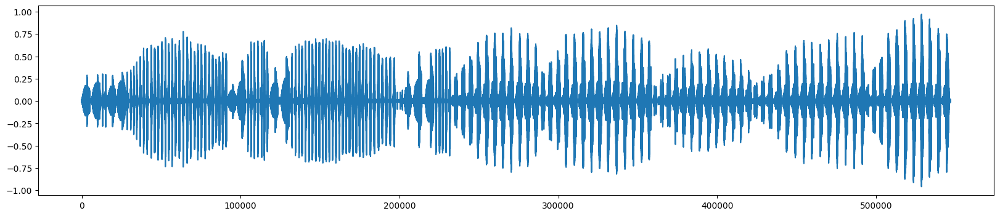

In [151]:
aud = 'data/norcar/XC109034.wav'
IPython.display.Audio(aud)
wf, sr = librosa.load(aud)
plt.figure(figsize=(20, 4))
plt.plot(wf)
plt.show()
IPython.display.Audio(aud)

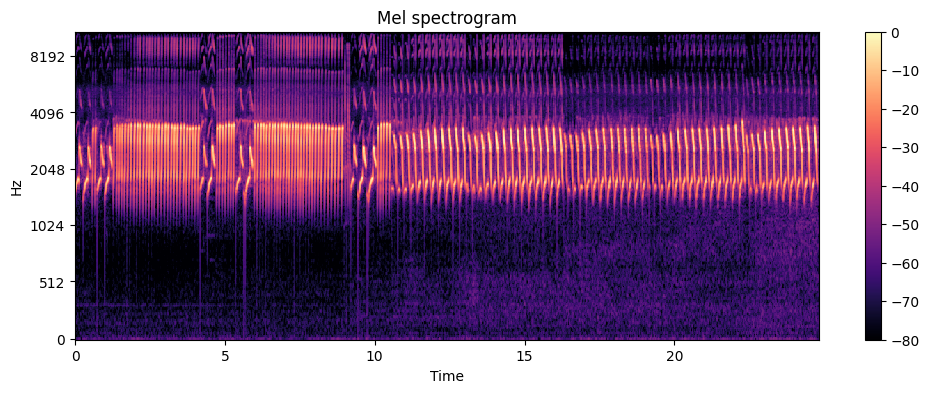

In [154]:
mel_spec = librosa.feature.melspectrogram(y=wf, sr=sr, n_mels=256)
plt.figure(figsize=(12, 4))
# librosa.display.specshow(mel_spec, y_axis='mel', x_axis='time', sr=sr, cmap='viridis');
librosa.display.specshow(librosa.power_to_db(mel_spec, ref=np.max), y_axis='mel', x_axis='time');
plt.title('Mel spectrogram')
plt.colorbar()
plt.show()

In [142]:
data = 'data'
species = os.listdir(data)
paths = []
labels = []

MAX_DURATION_IN_SAMPLES = 250000

for i, specie in enumerate(species):
    species_paths = os.listdir(os.path.join(data, specie))
    for path in species_paths[:100]:
        paths.append(os.path.join(data, specie, path))
        labels.append(specie)
        
embeds = []
for path in paths:
    y, sr = librosa.load(path, sr=None)
    if y.shape[0] > MAX_DURATION_IN_SAMPLES:
        begin = rng.integers(0, y.shape[0] - MAX_DURATION_IN_SAMPLES)
        y = y[begin: begin + MAX_DURATION_IN_SAMPLES]
    spec = librosa.feature.melspectrogram(
        y=y, 
        sr=sr, 
        n_mels=64, 
        n_fft=int(sr * 0.02), 
        hop_length=int(sr * 0.01), 
        fmax=10000, 
        fmin=100
    )
    embeds.append(librosa.util.normalize(np.mean(spec, axis=1)))

embeds = np.array(embeds)

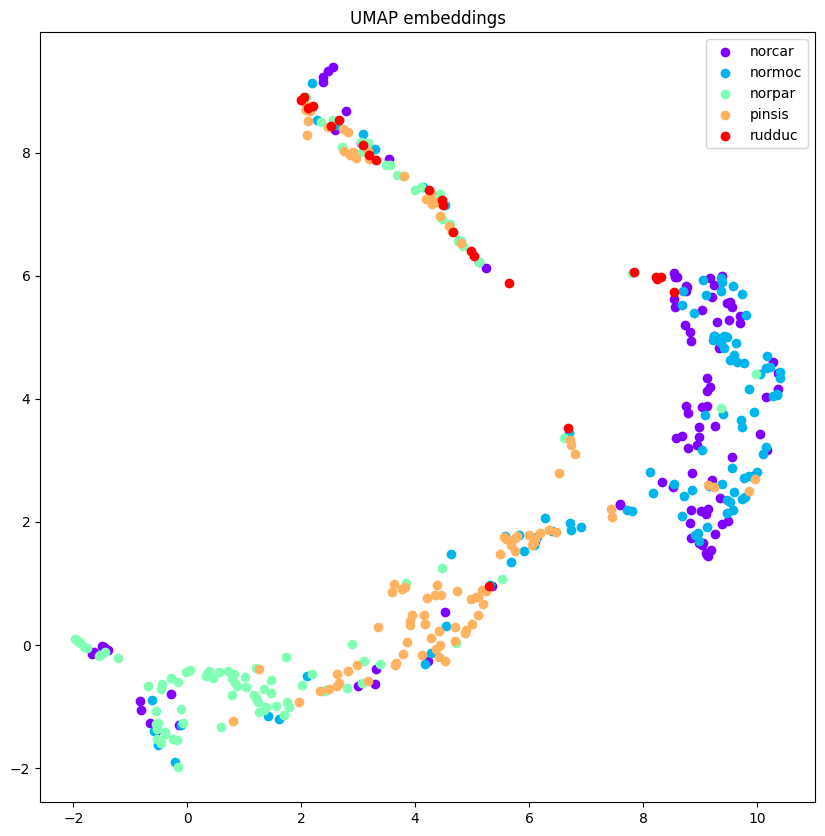

In [143]:
embeds_2d = umap.UMAP().fit_transform(embeds)
labels = np.array(labels)
unique_labels = np.unique(labels)
# unique_labels = np.array(['norcar', 'normoc', 'norpar', 'pinsis', 'rudduc'])
colors = plt.cm.rainbow(np.linspace(0, 1, len(unique_labels)))
points_x = []
points_y = []
plt.figure(figsize=(10, 10))
for i, color in enumerate(colors):
    points_x.append(np.transpose(embeds_2d[np.where(labels == unique_labels[i])])[0])
    points_y.append(np.transpose(embeds_2d[np.where(labels == unique_labels[i])])[1])
    plt.scatter(points_x[i], points_y[i], color=color, label=unique_labels[i])
plt.title('UMAP embeddings')
plt.legend()
plt.show()

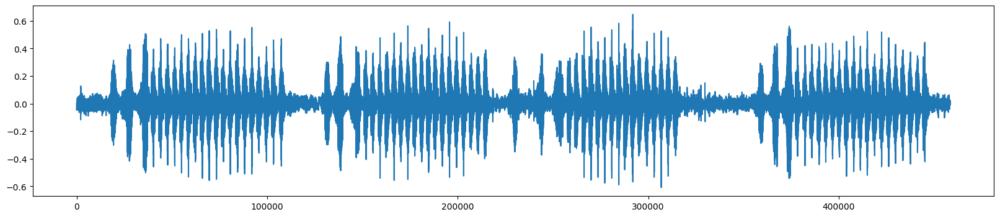

In [156]:
audio_path = 'data/norcar/XC11846.wav'
wf, _ = librosa.load(audio_path)
plt.figure(figsize=(20, 4))
plt.plot(wf)
plt.show()
IPython.display.Audio(audio_path)

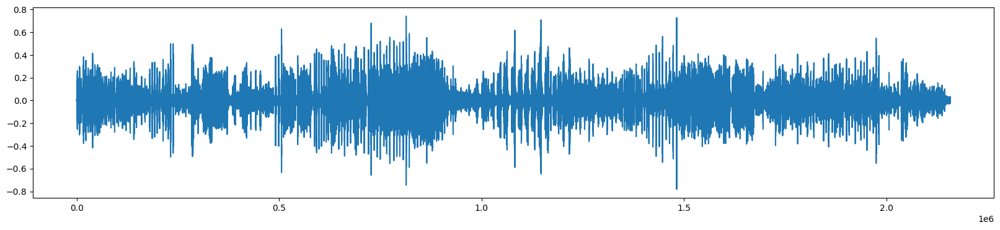

In [157]:
audio_path = 'data/normoc/XC54018.wav'
wf, _ = librosa.load(audio_path)
plt.figure(figsize=(20, 4))
plt.plot(wf)
plt.show()
IPython.display.Audio(audio_path)